# پروژه نهایی مهتا پناهی

# فراخوانی کتابخانه های لازم 

In [2]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
from scipy.stats import jarque_bera
import plotfa
from plotfa import fa

In [3]:
df = pd.read_excel('2402-5.xlsx')
df

,نام برگ,شرح,واحد,دوره,تواتر
0,HS_2d_dlr,واردات بر حسب کدهای دورقمی HS,هزار دلار,1390 -1397,فصلی
1,ISIC3.1_2d_dlr,واردات بر حسب کدهای دورقمی ISIC3.1,هزار دلار,1390 -1397,فصلی
2,ISIC4_2d_dlr,واردات بر حسب کدهای دورقمی ISIC4,هزار دلار,1390 -1397,فصلی
3,CPC1_2d_dlr,واردات بر حسب کدهای دورقمی CPC1,هزار دلار,1390 -1397,فصلی
4,CPC2_2d_dlr,واردات بر حسب کدهای دورقمی CPC2,هزار دلار,1390 -1397,فصلی
5,CPC1_4d_dlr,واردات بر حسب کدهای 4رقمی ISIC3.1,هزار دلار,1390 -1397,فصلی
6,CPC2_4d_dlr,واردات بر حسب کدهای4رقمی ISIC4,هزار دلار,1390 -1397,فصلی
7,ISIC3.1_4d_dlr,واردات بر حسب کدهای 4 رقمی CPC1,هزار دلار,1390 -1397,فصلی
8,ISIC4_4d_dlr,واردات بر حسب کدهای 4 رقمی CPC2,هزار دلار,1390 -1397,فصلی
9,BEC_dlr,واردات بر حسب کدهای 3 رقمی BEC,هزار دلار,1390 -1397,فصلی


# توضیحات در مورد دیتاست #
<div  dir = 'rtl'>
در این قسمت به این مورد میپردازیم که این فایل دارای چه اطلاعاتی است:
 
ستون نام برگ : شامل اسامی <code>sheet_name</code > است 

شرح که درمورد ویژگی دیتا صحبت میکند 

واحد : حجم واردات بر چه حسبی محاسبه شده است 

دوره زمانی جمع اوری دیتا ها 

تواتر برحسب فصل داده ها جمع اوری شده است 

نکته مهم : ما برای بررسی خود <code>sheet : HS_2d_dlr</code> را انتخاب کردیم

خط 13 و 14 به عنوان توضیح در فایل امده است 
</div> 

In [4]:
df_1  = pd.read_excel('2402-5.xlsx',sheet_name= 'HS_2d_dlr')
df_1.head()

,HS2,hs_2,1390_1,1390_2,1390_3,1390_4,1391_1,1391_2,1391_3,1391_4,...,1395_3,1395_4,1396_1,1396_2,1396_3,1396_4,1397_1,1397_2,1397_3,1397_4
0,H01,حيوانات زنده,7046.78,16523.32,13811.73,966.96,4664.36,5692.78,7410.36,9738.74,...,6986.33,25029.83,15548.46,13063.24,19797.10,19146.40,10449.58,2408.66,6041.72,36211.40
1,H02,گوشت و احشا خوراكي,274083.40,268988.58,191687.38,42130.55,116171.25,141798.70,272421.98,257178.28,...,97455.31,164973.20,141488.03,140724.29,226400.27,218527.39,180134.62,197038.29,229463.95,205944.86
2,H03,ماهيها و قشرداران - صدفداران و ساير آبزيان فاق...,13677.26,18638.95,14814.88,5329.54,9937.26,18550.12,20201.93,13799.07,...,51845.40,54972.14,28155.89,36739.65,40367.81,39771.66,16709.25,16740.59,16571.29,8515.42
3,H04,شير و محصولات حيواني كه در جاي ديگر گفته نشده ...,142803.97,71599.69,66451.29,23114.38,57781.50,101758.06,95855.99,156025.96,...,63560.26,62680.22,66687.75,64973.67,74585.04,89318.44,78247.07,85110.98,67470.33,54693.59
4,H05,ساير محصولات حيواني كه درجاي ديگر گفته نشده و ...,4104.88,1112.71,2717.77,279.23,2744.75,1136.65,2920.33,3888.51,...,1469.17,6005.90,2490.96,1505.81,2924.49,1536.72,922.24,1176.65,2906.47,2532.28


# بررسی مقادیر عددی ستون ها 

In [5]:
df_1.describe()

,1390_1,1390_2,1390_3,1390_4,1391_1,1391_2,1391_3,1391_4,1392_1,1392_2,...,1395_3,1395_4,1396_1,1396_2,1396_3,1396_4,1397_1,1397_2,1397_3,1397_4
count,9.400000e+01,9.400000e+01,9.400000e+01,94.000000,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,...,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01
mean,1.443887e+05,1.614139e+05,1.452353e+05,53243.990319,1.282899e+05,1.495699e+05,1.472994e+05,1.423762e+05,9.816426e+04,1.174296e+05,...,1.161180e+05,1.902763e+05,1.275836e+05,1.474934e+05,1.419511e+05,1.606561e+05,1.163779e+05,1.156996e+05,1.119233e+05,1.093228e+05
std,3.753552e+05,4.028004e+05,3.744007e+05,135094.538532,3.394528e+05,3.580897e+05,3.535587e+05,3.350070e+05,2.281925e+05,2.641164e+05,...,2.580940e+05,4.382512e+05,2.737130e+05,3.375990e+05,3.231800e+05,3.701326e+05,2.847760e+05,2.745910e+05,2.668857e+05,2.680635e+05
min,4.015000e+01,4.883000e+01,4.421000e+01,0.000000,2.866000e+01,4.139000e+01,0.000000e+00,0.000000e+00,4.780000e+00,0.000000e+00,...,0.000000e+00,1.897000e+01,0.000000e+00,1.755000e+01,7.000000e-01,1.150000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,3.906610e+03,4.557080e+03,4.931225e+03,1502.290000,2.709515e+03,3.504640e+03,3.156008e+03,2.327155e+03,1.209628e+03,1.711308e+03,...,4.201773e+03,6.258450e+03,3.771940e+03,4.304970e+03,6.047860e+03,5.927302e+03,3.094387e+03,2.267240e+03,2.655010e+03,1.461800e+03
50%,2.668699e+04,2.229437e+04,2.563253e+04,8940.905000,1.551089e+04,2.250611e+04,2.331762e+04,1.891194e+04,1.554749e+04,1.925447e+04,...,2.930303e+04,4.641299e+04,3.027490e+04,4.014912e+04,3.592101e+04,4.366235e+04,2.416378e+04,1.784372e+04,2.130547e+04,2.027144e+04
75%,1.305901e+05,1.120435e+05,9.255261e+04,32070.590000,7.057035e+04,9.317412e+04,9.385629e+04,9.511627e+04,7.186940e+04,8.961434e+04,...,9.198660e+04,1.443279e+05,1.069703e+05,1.085133e+05,1.026313e+05,1.252092e+05,8.909479e+04,9.129015e+04,1.013486e+05,8.430160e+04
max,2.891054e+06,2.935803e+06,2.688573e+06,990614.370000,2.304789e+06,2.519051e+06,2.096109e+06,2.103100e+06,1.349174e+06,1.722713e+06,...,1.740644e+06,3.222042e+06,1.969225e+06,2.328275e+06,2.328992e+06,2.683266e+06,2.040085e+06,1.897724e+06,2.130196e+06,1.875177e+06


# بررسی مقادیر گم شده در دیتا ست 

In [7]:
df_1.iloc[:,2:].astype('float').isna().sum()

1390_1    0
1390_2    0
1390_3    0
1390_4    0
1391_1    0
1391_2    0
1391_3    0
1391_4    0
1392_1    0
1392_2    0
1392_3    0
1392_4    0
1393_1    0
1393_2    0
1393_3    0
1393_4    0
1394_1    0
1394_2    0
1394_3    0
1394_4    0
1395_1    0
1395_2    0
1395_3    0
1395_4    0
1396_1    0
1396_2    0
1396_3    0
1396_4    0
1397_1    0
1397_2    0
1397_3    0
1397_4    0
dtype: int64

 # بررسی نرمالیتی دیتا ها :

In [85]:
for i in range(len(df_1)):
    jb_statistic, jb_p_value = jarque_bera(df_1.iloc[i,2:].astype('float'))
    print(f"آماره آزمون جارک-برا: {jb_statistic:.2f}")
    print(f"مقدار احتمال (p-value): {jb_p_value:.4f}")

آماره آزمون جارک-برا: 6.68
مقدار احتمال (p-value): 0.0354
آماره آزمون جارک-برا: 1.36
مقدار احتمال (p-value): 0.5071
آماره آزمون جارک-برا: 2.10
مقدار احتمال (p-value): 0.3494
آماره آزمون جارک-برا: 6.50
مقدار احتمال (p-value): 0.0387
آماره آزمون جارک-برا: 3.86
مقدار احتمال (p-value): 0.1452
آماره آزمون جارک-برا: 0.22
مقدار احتمال (p-value): 0.8948
آماره آزمون جارک-برا: 13.55
مقدار احتمال (p-value): 0.0011
آماره آزمون جارک-برا: 0.13
مقدار احتمال (p-value): 0.9364
آماره آزمون جارک-برا: 1.62
مقدار احتمال (p-value): 0.4442
آماره آزمون جارک-برا: 1.55
مقدار احتمال (p-value): 0.4597
آماره آزمون جارک-برا: 5.04
مقدار احتمال (p-value): 0.0806
آماره آزمون جارک-برا: 2.34
مقدار احتمال (p-value): 0.3111
آماره آزمون جارک-برا: 0.94
مقدار احتمال (p-value): 0.6260
آماره آزمون جارک-برا: 7.90
مقدار احتمال (p-value): 0.0193
آماره آزمون جارک-برا: 4.13
مقدار احتمال (p-value): 0.1270
آماره آزمون جارک-برا: 189.70
مقدار احتمال (p-value): 0.0000
آماره آزمون جارک-برا: 3.99
مقدار احتمال (p-value): 0.1358
آماره آزمون

#
<div dir = 'rtl'>
آمار آزمون (Test Statistic): این مقدار نشان‌دهنده تطابق داده‌ها با توزیع نرمال است. اگر آمار آزمون بزرگتر باشد، نرمالیتی داده‌ها رد می‌شود.

مقدار احتمال (p-value): این مقدار نشان‌دهنده احتمال این است که داده‌ها از توزیع نرمال پیروی کنند. اگر مقدار p-value کمتر از سطح معناداری (مثلاً 0.05) باشد، نرمالیتی داده‌ها رد می‌شود..
</div>

# مشخصات تایپ ستون ها

In [86]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94 entries, 0 to 93
Data columns (total 34 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   HS2     94 non-null     object 
 1   hs_2    94 non-null     object 
 2   1390_1  94 non-null     float64
 3   1390_2  94 non-null     float64
 4   1390_3  94 non-null     float64
 5   1390_4  94 non-null     float64
 6   1391_1  94 non-null     float64
 7   1391_2  94 non-null     float64
 8   1391_3  94 non-null     float64
 9   1391_4  94 non-null     float64
 10  1392_1  94 non-null     float64
 11  1392_2  94 non-null     float64
 12  1392_3  94 non-null     float64
 13  1392_4  94 non-null     float64
 14  1393_1  94 non-null     float64
 15  1393_2  94 non-null     float64
 16  1393_3  94 non-null     float64
 17  1393_4  94 non-null     float64
 18  1394_1  94 non-null     float64
 19  1394_2  94 non-null     float64
 20  1394_3  94 non-null     float64
 21  1394_4  94 non-null     float64
 22  1395

# رسم نمودار واردات در طی زمان

C:\Users\No1\AppData\Local\Temp\ipykernel_4068\2672600783.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig , ax = plt.subplots()


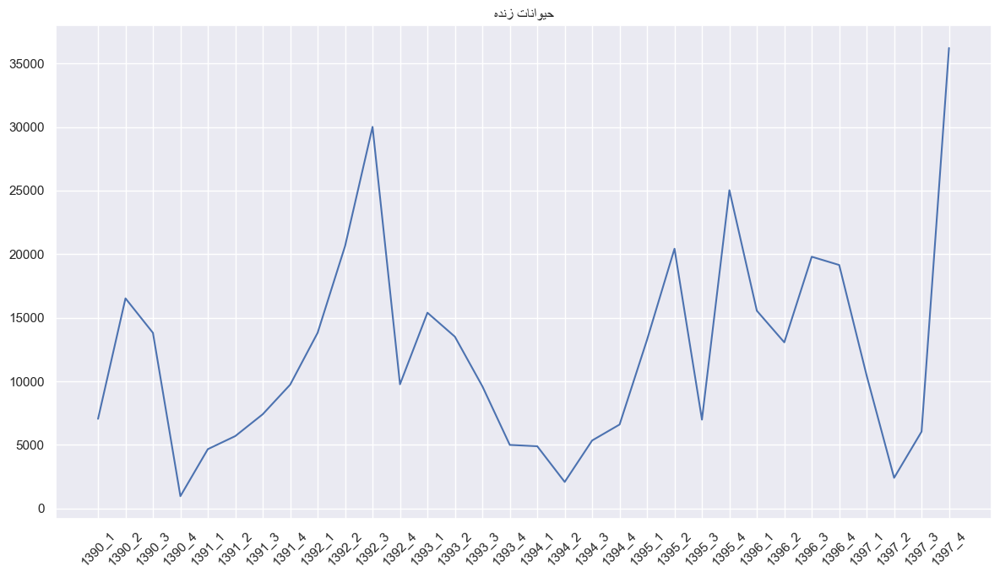

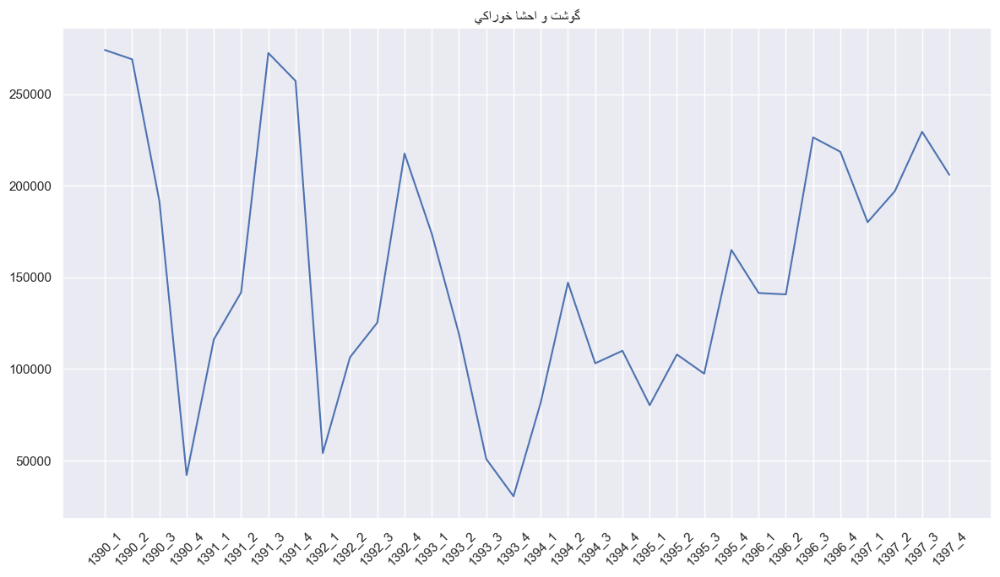

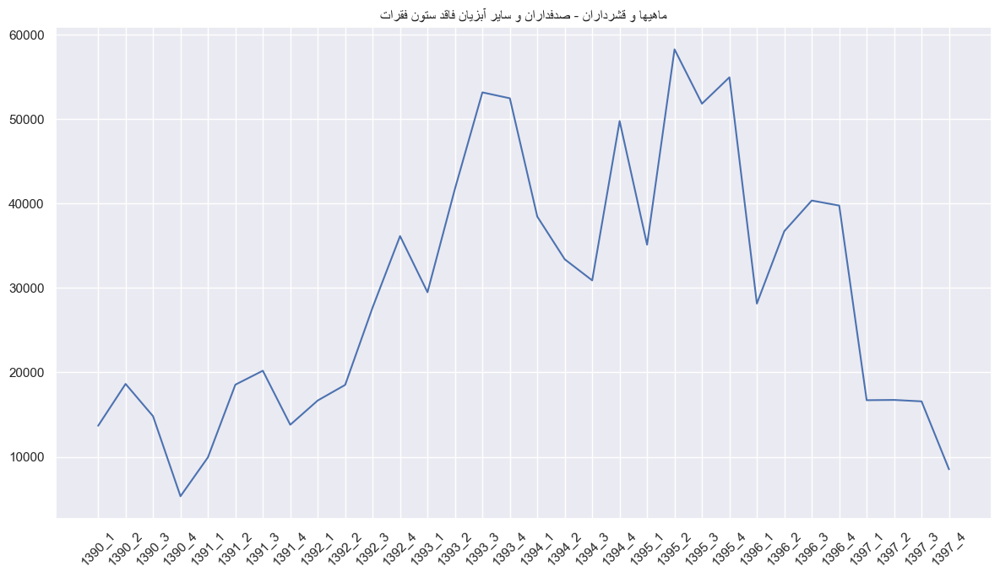

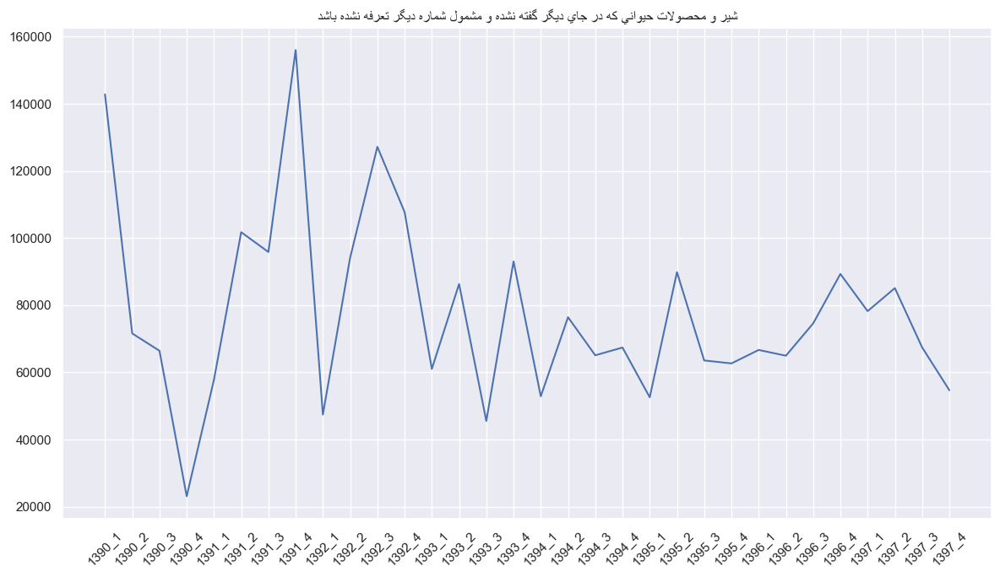

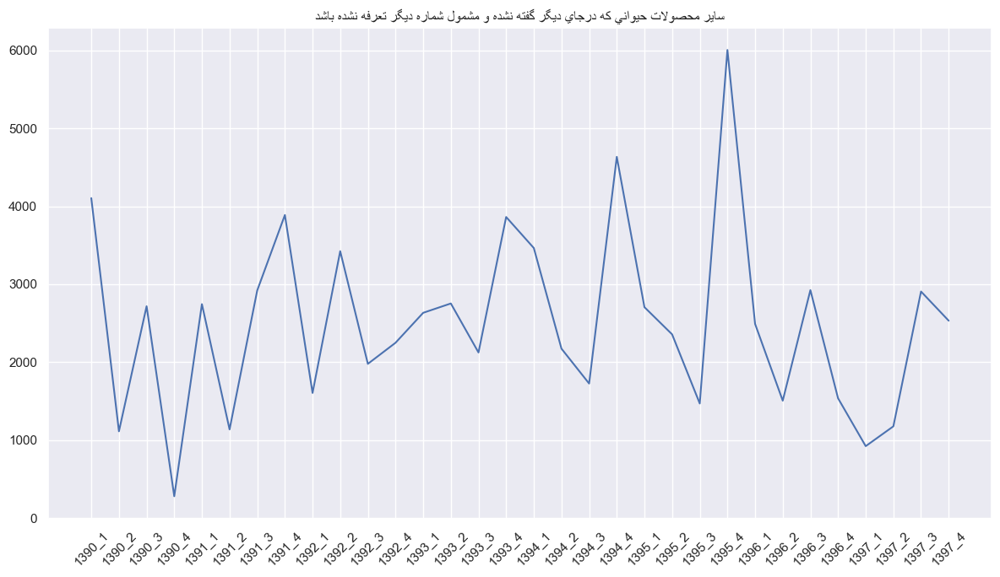

...

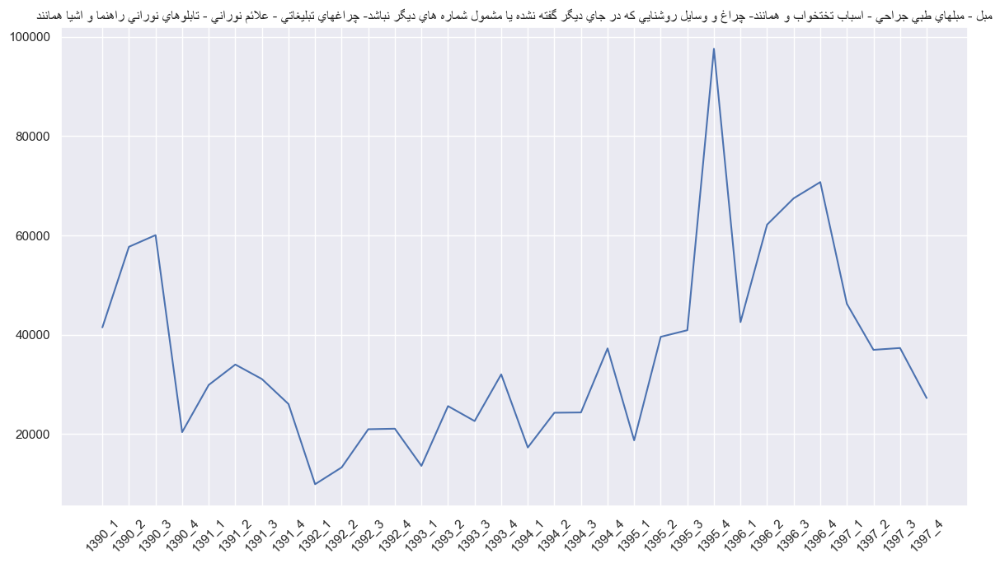

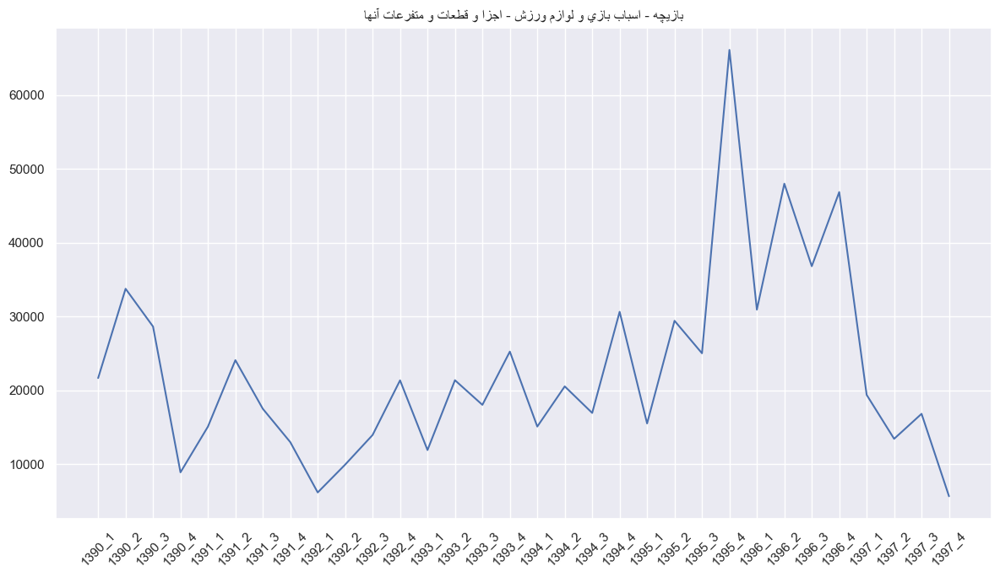

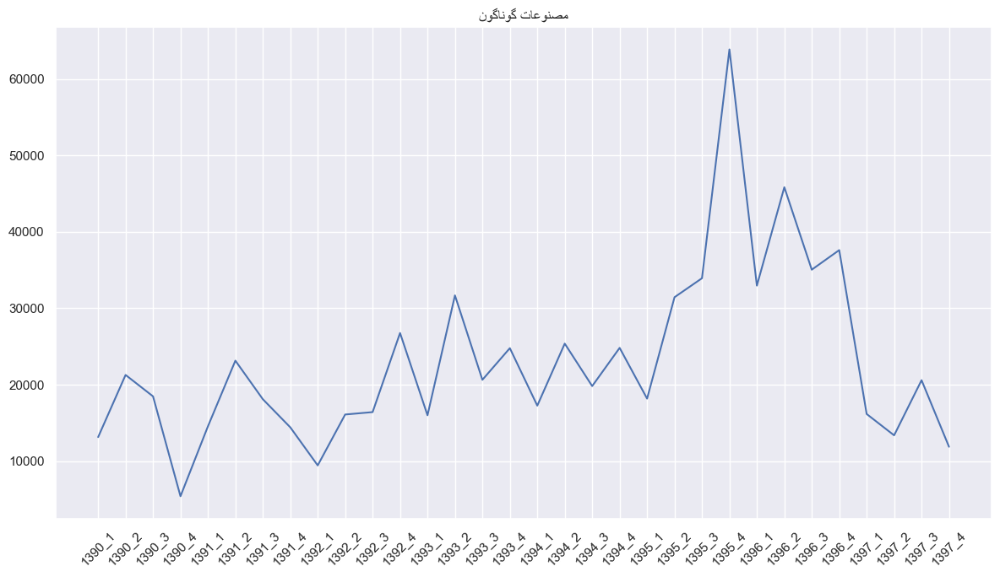

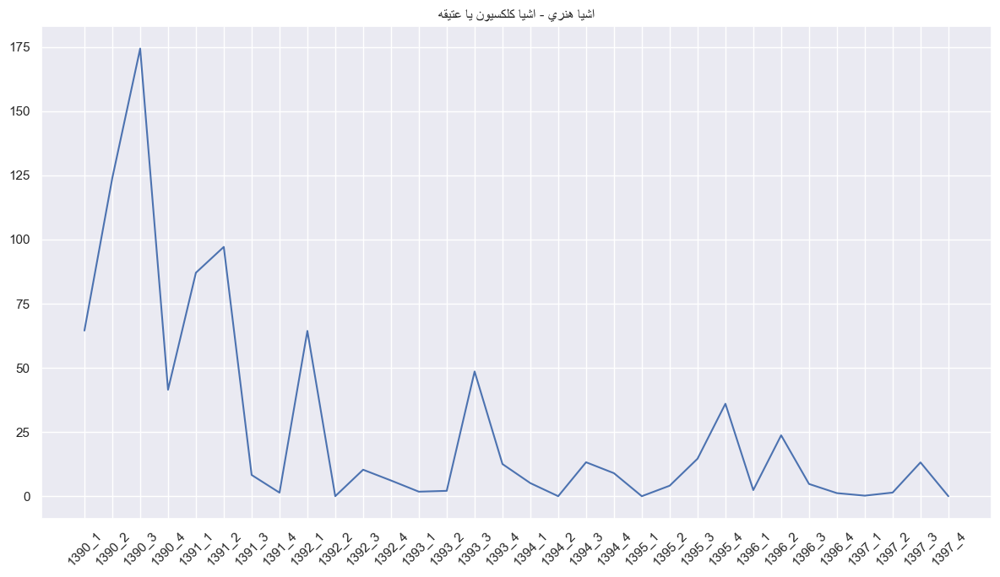

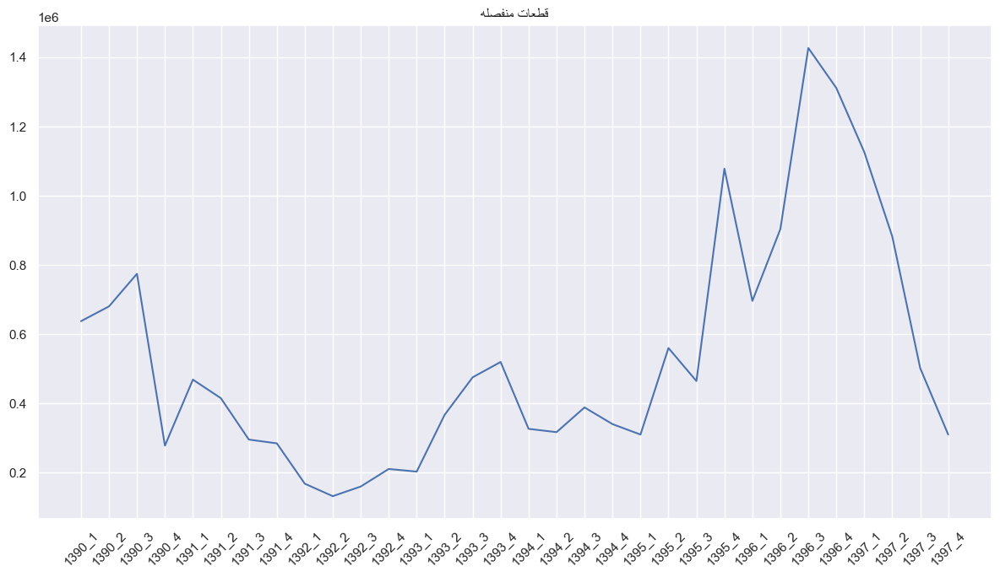

In [97]:
for i in range(len(df_1)):
    fig , ax = plt.subplots()
    fig.set_size_inches(12,7)
    ax.plot(df_1.iloc[i,2:])
    plt.xticks(rotation=45)
    ax.set_title(fa(df_1.iloc[i, 1]))
    plt.tight_layout()

# رسم مقایسه ای کالا ها در طول زمان 

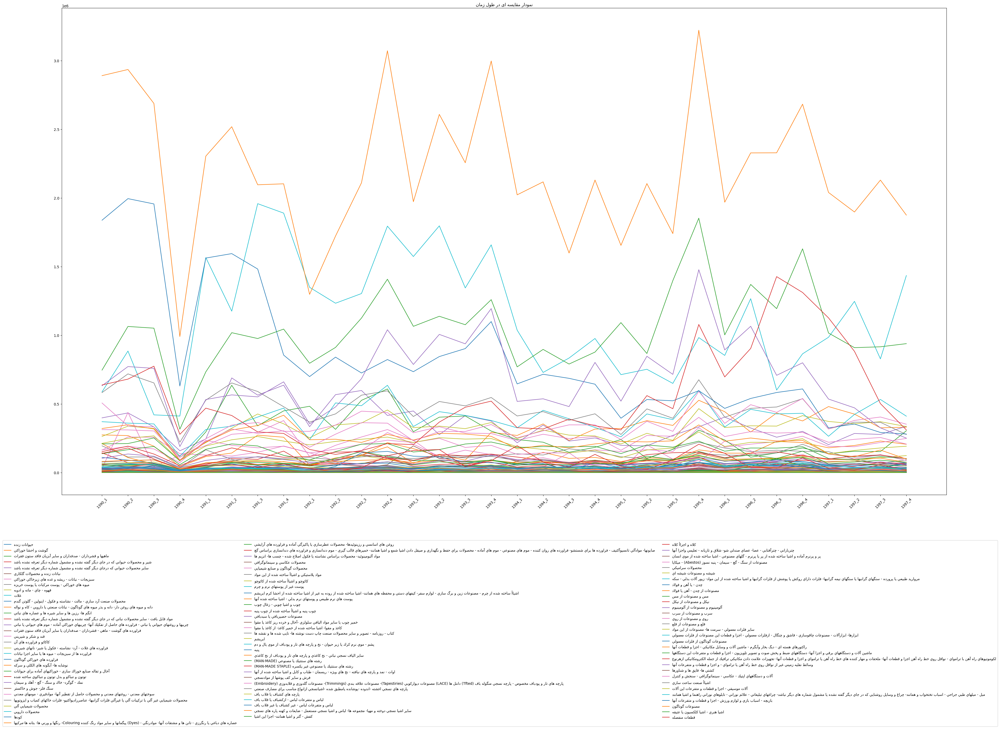

In [39]:
fig , ax  = plt.subplots(figsize =(35,20))
for i in range(len(df_1)):
    ax.plot(df_1.iloc[i,2:],label=fa(df_1.iloc[i, 1]))
    plt.xticks(rotation=45)
    ax.set_title(fa('نمودار مقایسه ای در طول زمان'))
    plt.tight_layout()
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=3);

# مقایسه ضرایب همبستگی میان زمان های واردات

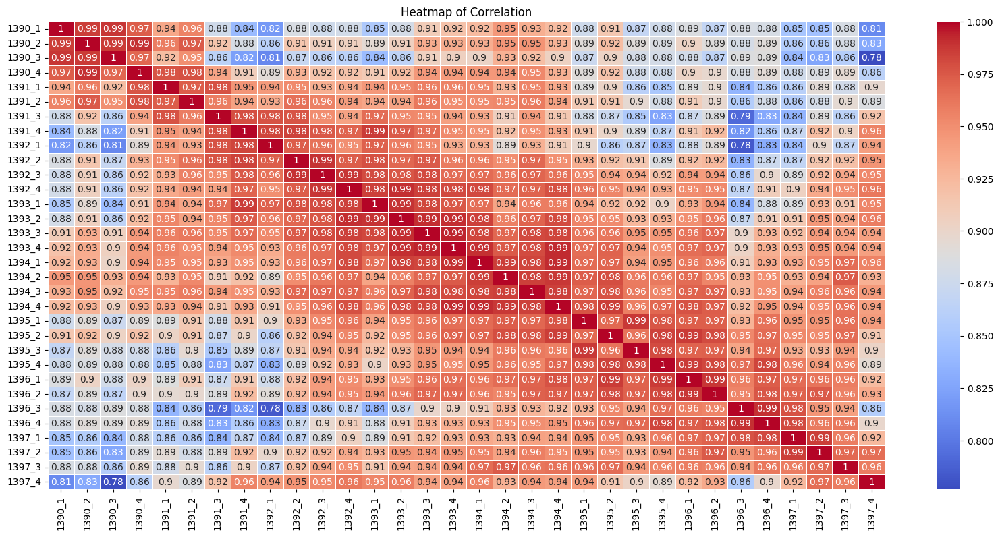

In [9]:
correlation_matrix = (df_1.iloc[:,2:].astype('float')).corr()
plt.figure(figsize=(20, 9))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Heatmap of Correlation")
plt.show()